**<h1> Manipulating Images </h1>**


Estimated time needed: **30** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, OpenCV image Arrays. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab


In [ ]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png 
# dùng !wget để tải 3 file ảnh từ URL về local

--2026-01-16 13:28:12--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 169.45.118.108
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|169.45.118.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 663451 (648K) [image/png]
Saving to: ‘cat.png’

cat.png             100%[===================>] 647.90K   503KB/s    in 1.3s    

2026-01-16 13:28:14 (503 KB/s) - ‘cat.png’ saved [663451/663451]

--2026-01-16 13:28:15--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.

We will be using these imported functions in the lab


In [ ]:
import matplotlib.pyplot as plt # Vẽ đồ thị và hiển thị ảnh
import cv2 # OpenCV - xử lý ảnh chính
import numpy as np # Xử lý mảng số

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the following array:


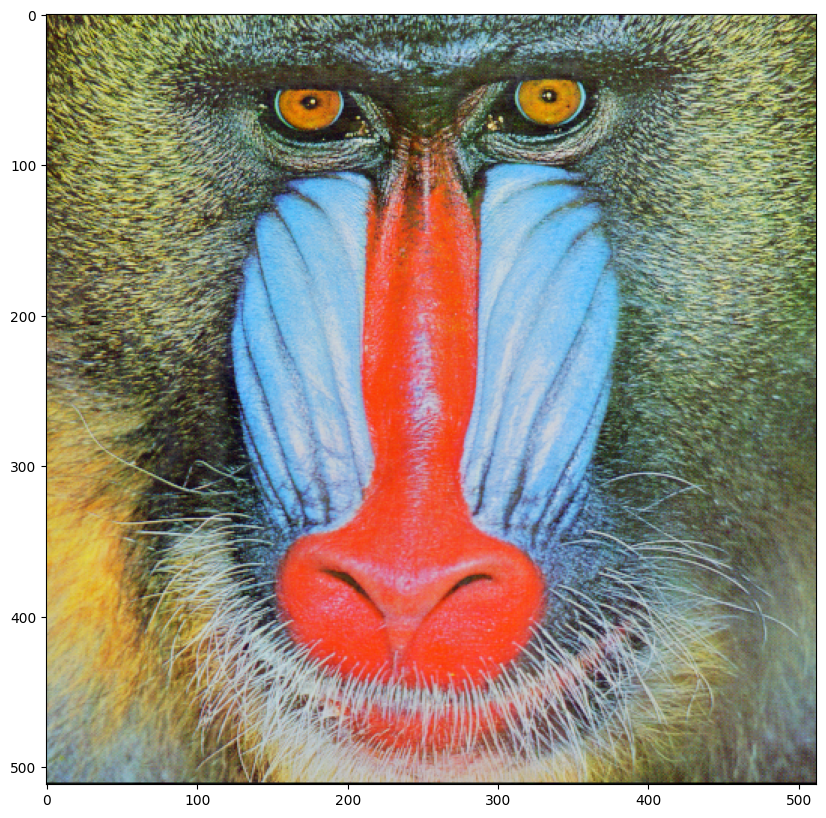

In [ ]:
baboon = cv2.imread("baboon.png") # Đọc ảnh BGR 
plt.figure(figsize=(10,10)) # Tạo figure kích thước 10x10 inch
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))# Chuyển BGR sang sang RGB để hiển thị đúng màu
plt.show() # Hiển thị ảnh

If we do not apply the method `copy()`, the new variable will point to the same location in memory:


In [ ]:
A = baboon # Tạo reference 

we use the `id` function to find the object's memory address; we see it is the same as the original array.


In [ ]:
id(A)==id(baboon) # True - cùng ID object
id(A) # In ID của object A

4386500368

If we apply the method `copy()</coode>, the memory address is different 


In [ ]:
B = baboon.copy() # Tạo bản sao độc lập
id(B)==id(baboon) # False - khác ID object


False

When we do not apply the method <code>copy()</code>, the variable will point to the same location in memory. Consider the array <code>baboon</code>, if we set all its values to zero, then all the values in <code>A</code> will be zero. This is because <code>baboon</code> and <code>A</code> point to the same place in memory, but <code>B</code> will not be affected. 


In [ ]:
baboon[:,:,] = 0 # Gán tất cả pixel = 0 (màu đen)


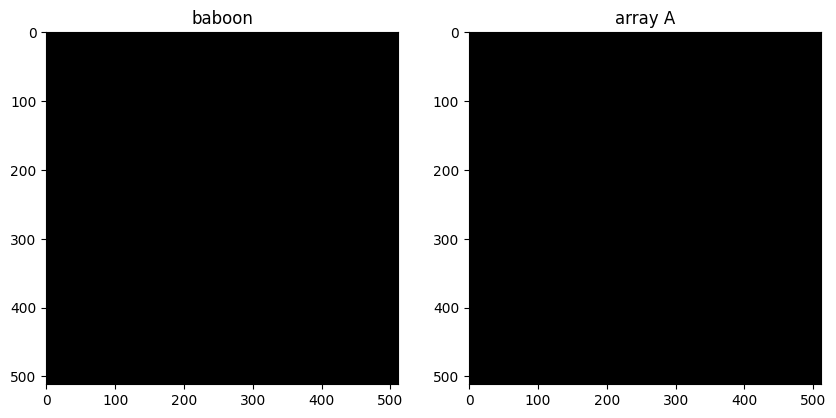

In [ ]:
plt.figure(figsize=(10,10)) #Tạo một figure (khung hiển thị) mới với kích thước 10x10 inch
plt.subplot(121) # Tạo một grid layout 1 hàng × 2 cột (ký hiệu: 1,2)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
#Thêm tiêu đề "baboon" cho subplot đầu tiên
plt.title("baboon")
#Chuyển sang subplot thứ 2 (ô bên phải)
plt.subplot(122)
#Hiển thị ảnh A và thêm tiêu đề "array A"
plt.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB))
plt.title("array A")
#Hiển thị toàn bộ figure với 2 ảnh cạnh nhau
plt.show()

We see they are the same, this is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable because variables are just names that store references to values. We can also compare <code>baboon</code> and array <code>B</code>:


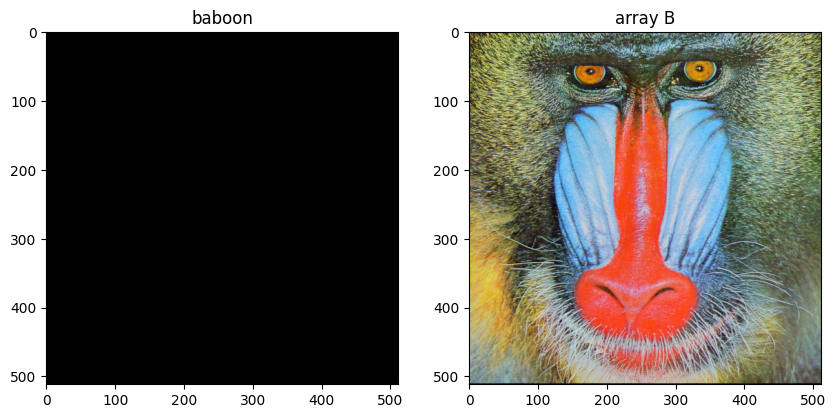

In [ ]:
# Tạo figure mới kích thước 10x10 inch
plt.figure(figsize=(10,10))
# Tạo layout 1 hàng × 2 cột, chọn ô đầu tiên (bên trái)
plt.subplot(121)
# Hiển thị ảnh baboon (đã bị thay đổi thành màu đen ở code trước)
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))
plt.title("baboon")
# Chuyển sang ô thứ 2
#Hiển thị ảnh B
plt.subplot(122)
plt.imshow(cv2.cvtColor(B, cv2.COLOR_BGR2RGB))
plt.title("array B")
plt.show()


They are different because they used the method copy.


## Fliping Images 


Flipping images involves reordering the index of the pixels such that it changes the orientation of the image. Consider the following image:


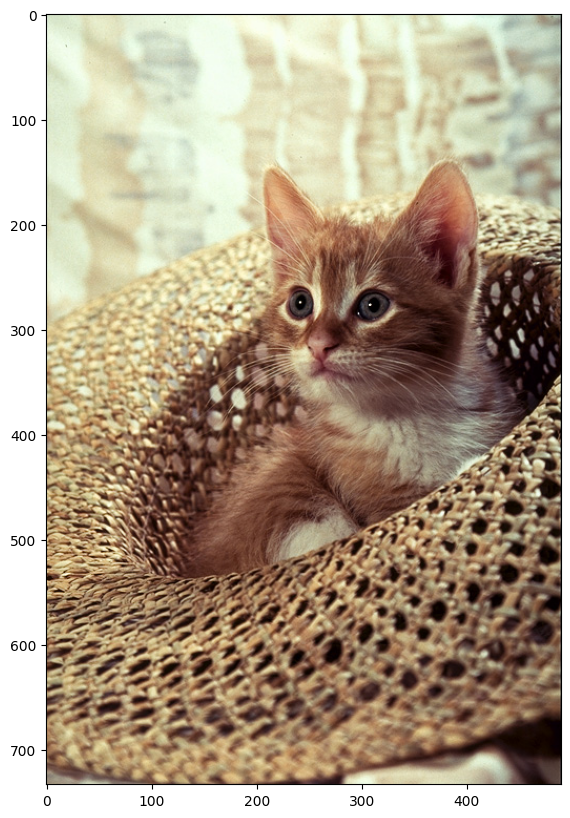

In [ ]:
# Đọc file ảnh 
image = cv2.imread("cat.png")
# Tạo figure mới kích thước 10x10 inch
plt.figure(figsize=(10,10))
 # Hiển thị ảnh lên figure:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
# Hiển thị figure đã được tạo
plt.show()

We can cast it to an array and find the shape:


In [ ]:
# Truy xuất thông tin kích thước của ảnh từ thuộc tính shape của NumPy array
width, height,C=image.shape
# Gán các giá trị lần lượt cho các biến width, height, C
print('width, height,C',width, height,C) 

width, height,C 733 490 3


Let's Flip i.e rotate it vertically. First, we create an array of equal size of type <code>np.uint8</code> bit image.


In [ ]:
# Tạo một NumPy array mới với tất cả giá trị bằng 0 để chuẩn bị cho việc lật ảnh
array_flip = np.zeros((width, height,C),dtype=np.uint8)

We assign the first row of pixels of the original array to the new array's last row. We repeat the process for every row, incrementing the row number for the original array and decreasing the new array's row index assigning the pixels accordingly.


In [ ]:
# Thực hiện lật ảnh theo chiều dọc (vertical flip) bằng vòng lặp

for i,row in enumerate(image):
        array_flip[width-1-i,:,:]=row

We plot the results


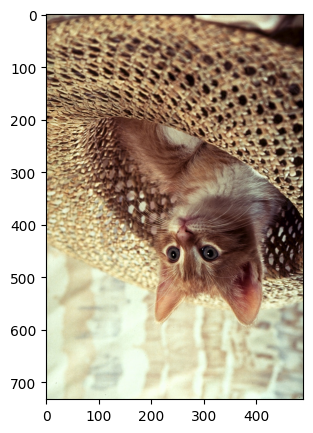

In [ ]:
# Tạo một figure (khung hiển thị) mới với kích thước nhỏ hơn: 5 inch x 5 inch
plt.figure(figsize=(5,5))
# Hiển thị ảnh array_flip (ảnh đã được lật ngược) lên figure
plt.imshow(cv2.cvtColor(array_flip, cv2.COLOR_BGR2RGB))
# Hiển thị figure đã được tạo và vẽ ảnh
plt.show()

<code>OpenCV</code>has several ways to flip an image, we can use  the <code>flip()</code> function; we have the input image array. The parameter is the <code>flipCode</code>

is the value indicating what kind of flip we would like to perform; 
<li><code>flipcode</code> = 0: flip vertically around the x-axis</li>
<li><code>flipcode</code> > 0: flip horizontally around y-axis positive value</li>
<li><code>flipcode</code>&#60 0: flip vertically and horizontally, flipping around both axes negative value</li>
Let apply different <code>flipcode</code>'s in a loop:


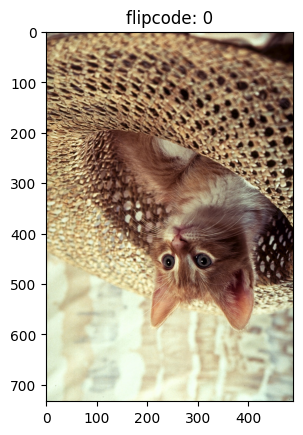

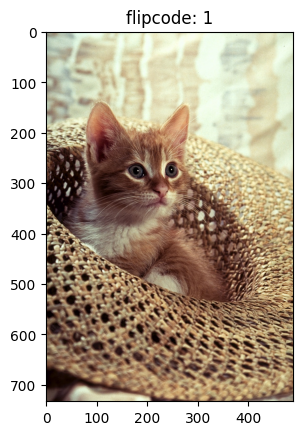

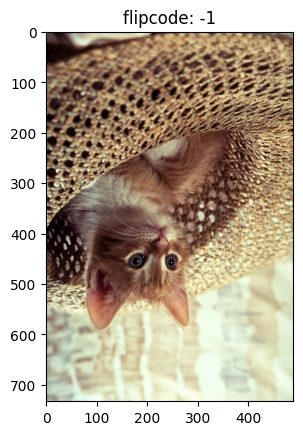

In [ ]:
# Duyệt qua 3 giá trị flipcode khác nhau để thực hiện các kiểu lật ảnh khác nhau
# flipcode = 0: lật theo chiều dọc 
# flipcode = 1: lật theo chiều ngang 
# flipcode = -1: lật cả hai chiều 
for flipcode in [0,1,-1]:
    # Hàm trả về ảnh đã được lật
    im_flip =  cv2.flip(image,flipcode )
    # Hiển thị ảnh đã lật lên figure
    plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
    # Thêm tiêu đề cho ảnh hiển thị
    plt.title("flipcode: "+str(flipcode))
    plt.show()

We can also use the <code>rotate()</code> function. The parameter is an integer indicating what kind of flip we would like to perform. 


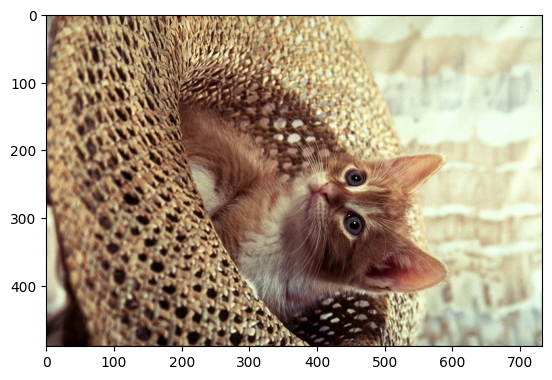

In [ ]:
# Thực hiện xoay ảnh sử dụng hàm cv2.rotate() của OpenCV
im_flip = cv2.rotate(image,0)
# Hiển thị ảnh đã "xoay" (thực tế là không xoay) lên figure
plt.imshow(cv2.cvtColor(im_flip,cv2.COLOR_BGR2RGB))
plt.show()

OpenCV module has built-in attributes the describe the type of flip, the values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
# Tạo một dictionary để ánh xạ tên góc xoay dễ đọc với mã xoay tương ứng trong OpenCV
flip = {"ROTATE_90_CLOCKWISE":cv2.ROTATE_90_CLOCKWISE,"ROTATE_90_COUNTERCLOCKWISE":cv2.ROTATE_90_COUNTERCLOCKWISE,"ROTATE_180":cv2.ROTATE_180}

We see the keys are just an integer


In [ ]:
# Truy cập giá trị từ dictionary "flip" sử dụng key "ROTATE_90_CLOCKWISE"
flip["ROTATE_90_CLOCKWISE"]

0

We can plot each of the outputs using the different  parameter values 


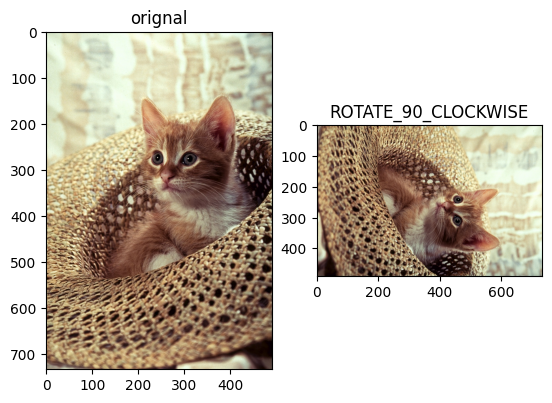

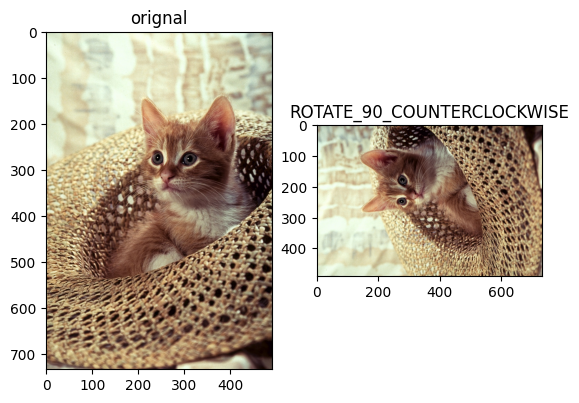

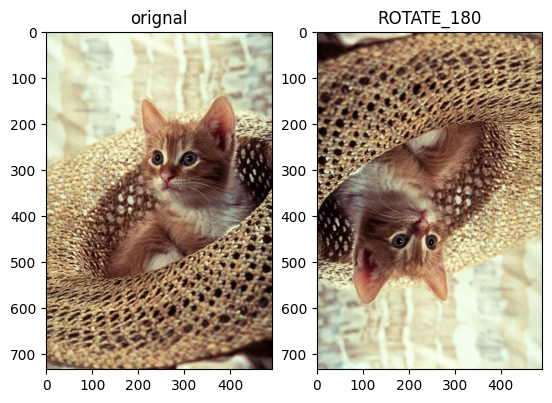

In [ ]:
# Duyệt qua tất cả các cặp key-value trong dictionary flip
for key, value in flip.items():
     # Tạo subplot đầu tiên trong layout 1 hàng × 2 cột

    plt.subplot(1,2,1)
     # Hiển thị ảnh gốc trên subplot đầu tiên
    # cv2.cvtColor(image, cv2.COLOR_BGR2RGB): Chuyển từ BGR sang RGB
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    # Thêm tiêu đề "orignal" (có lỗi chính tả, đúng là "original") cho ảnh gốc
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(cv2.cvtColor(cv2.rotate(image,value), cv2.COLOR_BGR2RGB))
    # Thêm tiêu đề là tên của góc xoay (key từ dictionary)
    plt.title(key)
    plt.show()

 ## Cropping an Image


Cropping is "cutting out" the part of the image and throwing out the rest; we can crop using arrays. Let start with a vertical crop; the variable <code>upper</code> is the first row that we would like to include in the image, the variable <code>lower</code> is the last row we would like to include. We then use slicing to obtain the new image. 


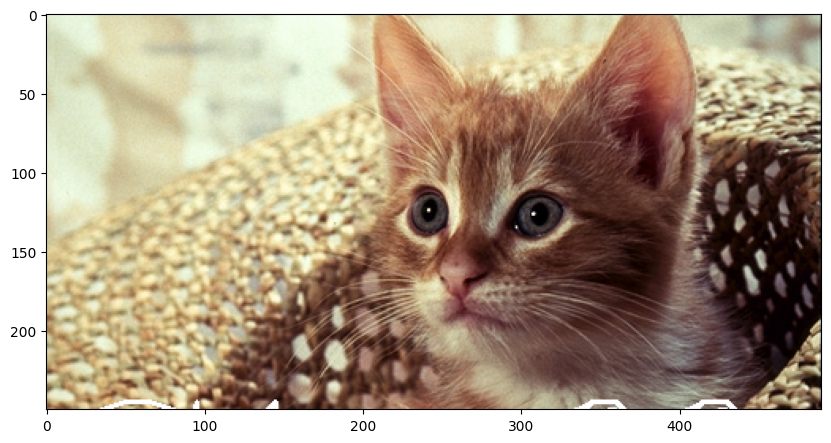

In [ ]:
# Định nghĩa giới hạn trên và dưới để cắt ảnh theo chiều dọc (trục y)
# upper = 150: vị trí pixel bắt đầu cắt (từ trên xuống)
# lower = 400: vị trí pixel kết thúc cắt
# Khoảng cách: 400 - 150 = 250 pixel chiều cao
upper = 150
lower = 400
# Thực hiện cắt ảnh theo chiều dọc (vertical cropping)
crop_top = image[upper: lower,:,:]
# Tạo một figure (khung hiển thị) mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))
# plt.imshow(): Vẽ ảnh lên figure hiện tại
plt.imshow(cv2.cvtColor(crop_top, cv2.COLOR_BGR2RGB))
plt.show()

consider the array <code>crop_top</code> we  can also crop horizontally  the variable right is the first column that we would like to include in the image, the variable left is the last column we would like to include in the image.


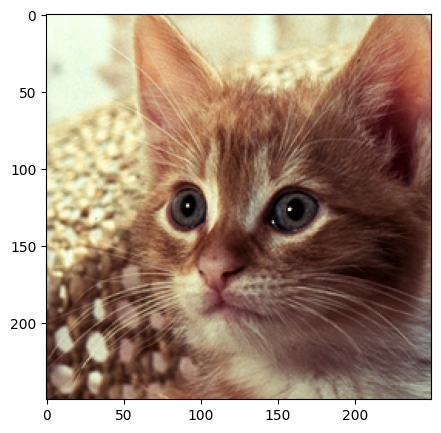

In [ ]:
# Định nghĩa giới hạn trái và phải để cắt ảnh theo chiều ngang (trục x)
# left = 150: vị trí pixel bắt đầu cắt từ trái sang
# right = 400: vị trí pixel kết thúc cắt
# Khoảng cách: 400 - 150 = 250 pixel chiều rộng
left = 150
right = 400
# Thực hiện cắt ảnh theo chiều ngang (horizontal cropping) trên ảnh đã cắt dọc trước đó
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
# plt.imshow(): Vẽ ảnh lên figure hiện tại
plt.imshow(cv2.cvtColor(crop_horizontal, cv2.COLOR_BGR2RGB))
# Hiển thị figure chứa ảnh đã cắt
plt.show()

## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the channels in the original image we cropped to zero :


In [ ]:
# Tạo một bản sao độc lập của ảnh gốc
array_sq = np.copy(image)
# Đặt tất cả pixel trong vùng chỉ định thành màu đen (giá trị 0)
array_sq[upper:lower,left:right,:] = 0

We can compare the results to the new image. 


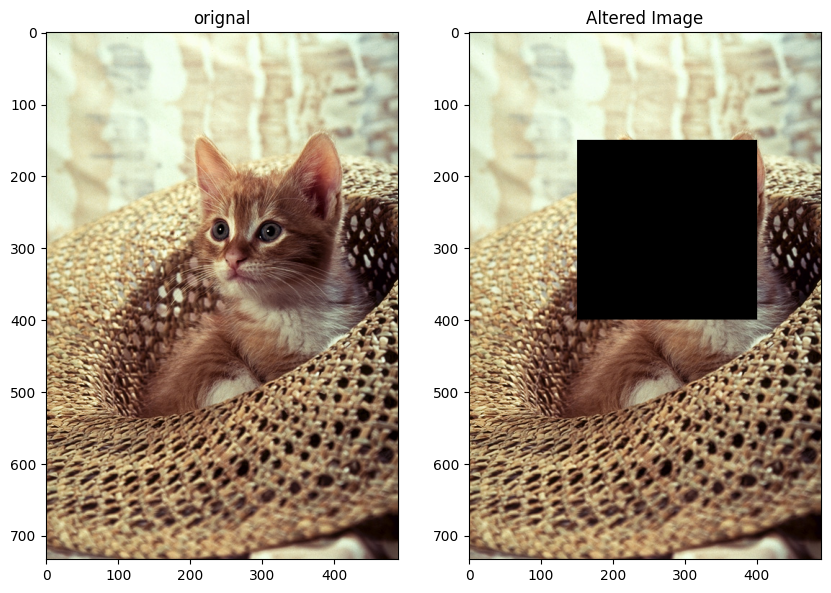

In [ ]:
# Tạo một figure (khung hiển thị) mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))
# Tạo subplot đầu tiên (bên trái) trong layout 1 hàng × 2 cột
plt.subplot(1,2,1)
# Hiển thị ảnh gốc trên subplot đầu tiên
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
# Thêm tiêu đề cho ảnh gốc (có lỗi chính tả: "orignal" thay vì "original")
plt.title("orignal")
# Tạo subplot thứ hai (bên phải) trong layout 1 hàng × 2 cột
# plt.subplot(1,2,2): 1 hàng, 2 cột, chọn ô thứ 2
plt.subplot(1,2,2)
# Hiển thị ảnh đã được thay đổi (array_sq) trên subplot thứ hai
plt.imshow(cv2.cvtColor(array_sq,cv2.COLOR_BGR2RGB))
# Thêm tiêu đề "Altered Image" (Ảnh đã thay đổi) và Hiển thị figure chứa cả hai ảnh cạnh nhau
plt.title("Altered Image")
plt.show()

  We can also create shapes and <code>OpenCV</code>, we can use the method <code>rectangle</code>. The parameter  <code>pt1</code> is the top-left coordinate of the rectangle: <code>(left,top)</code> or $(x_0,y_0)$, <code>pt2</code> is the bottom right coordinate<code>(right,lower)</code> or $(x_1,y_1)$. The parameter <code>color</code>  is a tuple representing the intensity of each channel <code>( blue, green, red)</code>. Finally, we have the line thickness.


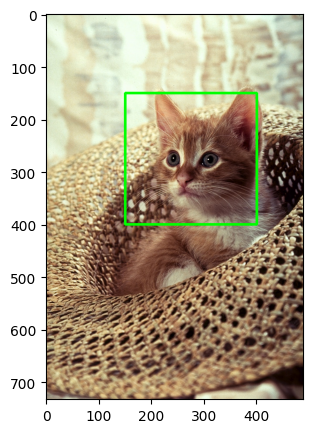

In [ ]:
# Định nghĩa điểm bắt đầu và điểm kết thúc của hình chữ nhật cần vẽ
start_point, end_point = (left, upper),(right, lower)
# Tạo một bản sao của ảnh gốc để vẽ lên mà không làm thay đổi ảnh gốc
image_draw = np.copy(image)
# Vẽ hình chữ nhật lên ảnh sử dụng OpenCV
cv2.rectangle(image_draw, pt1=start_point, pt2=end_point, color=(0, 255, 0), thickness=3) 
# Tạo một figure (khung hiển thị) mới với kích thước 5x5 inch
plt.figure(figsize=(5,5))
# Hiển thị ảnh đã vẽ hình chữ nhật
plt.imshow(cv2.cvtColor(image_draw, cv2.COLOR_BGR2RGB))
# Hiển thị figure
plt.show()

We can overlay text on an image using the function  <code>putText</code> with the following parameter values:



 <li><code>img</code>: Image array </li>
<li><code>text</code>: Text string to be overlayed</li>
<li><code>org</code>: Bottom-left corner of the text string in the image</li>
<li><code>fontFace</code>: tye type of font </li>
<li><code>fontScale</code>: Font scale</li>
<li><code>color</code>: Text color</li>
<li><code>thickness</code>: Thickness of the lines used to draw a text</li>
<li><code>lineType:</code> Line type</li>


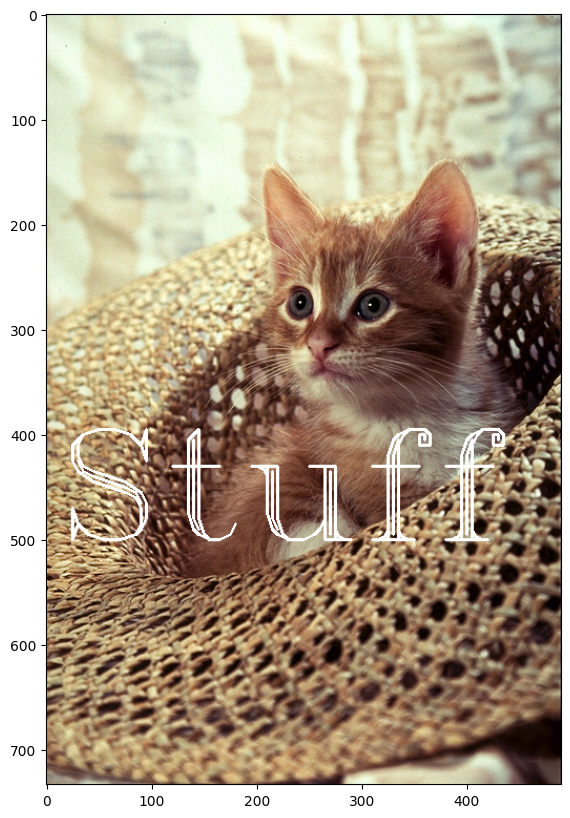

In [ ]:
# Vẽ text lên ảnh sử dụng OpenCV
# cv2.putText(): hàm vẽ text lên ảnh với các tham số
image_draw=cv2.putText(img=image,text='Stuff',org=(10,500),color=(255,255,255),fontFace=4,fontScale=5,thickness=2)
# Tạo một figure (khung hiển thị) mới với kích thước 10x10 inch
plt.figure(figsize=(10,10))
# Hiển thị ảnh đã có text được vẽ lên
plt.imshow(cv2.cvtColor(image_draw,cv2.COLOR_BGR2RGB))
# Hiển thị figure chứa ảnh
plt.show()

### Question-4: 
Use the image baboon.png from this lab or take any image you like.

Open the image and create a OpenCV Image object called `im`, convert the image from BGR format to RGB format, flip `im` vertically around the x-axis and create an image called `im_flip`, mirror `im` by flipping it horizontally around the y-axis and create an image called `im_mirror`, finally plot both images


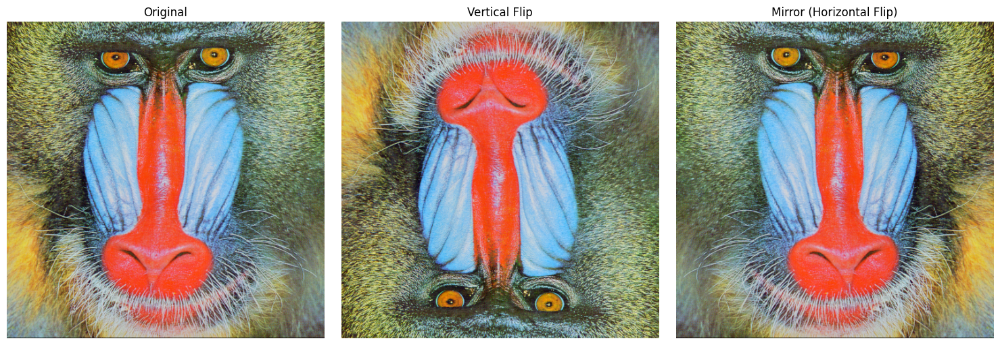

In [29]:
import cv2
import matplotlib.pyplot as plt

# Đọc ảnh và tạo đối tượng 'im'
im = cv2.imread("baboon.png")

# Chuyển BGR sang RGB
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Lật dọc (vertical flip)
im_flip = cv2.flip(im, 0)

# Lật ngang (mirror)
im_mirror = cv2.flip(im, 1)

# Hiển thị kết quả
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

titles = ["Original", "Vertical Flip", "Mirror (Horizontal Flip)"]
images = [im, im_flip, im_mirror]

for ax, img, title in zip(axes, images, titles):
    ax.imshow(img)
    ax.set_title(title)
    ax.axis('off')

plt.tight_layout()
plt.show()


Double-click **here** for a hint.

<!-- The hint is below:

im_flip =  cv2.flip(baboon,0)
im_mirror =  cv2.flip(baboon, 1)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = cv2.imread("baboon.png")

im_flip =  cv2.flip(im, 0)
plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB))
plt.show()

im_mirror =  cv2.flip(im, 1)
plt.imshow(cv2.cvtColor(im_mirror, cv2.COLOR_BGR2RGB))
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->


<h3 align="center"> &#169; IBM Corporation. All rights reserved. <h3/>
